## **BIL476 - BANKING DATASET ANALYSIS**

### **Upload The Banking Dataset**

In Banking Dataset Analysis Project, the dataset used is "Bank Marketing" dataset from UCI Machine Learning Repository. 

In [1]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
bank_marketing = fetch_ucirepo(id=222) 
  
# data (as pandas dataframes) 
X = bank_marketing.data.features 
y = bank_marketing.data.targets 
  
# metadata 
print(bank_marketing.metadata) 

# variable information  
display(bank_marketing.variables) 

{'uci_id': 222, 'name': 'Bank Marketing', 'repository_url': 'https://archive.ics.uci.edu/dataset/222/bank+marketing', 'data_url': 'https://archive.ics.uci.edu/static/public/222/data.csv', 'abstract': 'The data is related with direct marketing campaigns (phone calls) of a Portuguese banking institution. The classification goal is to predict if the client will subscribe a term deposit (variable y).', 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 45211, 'num_features': 16, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Occupation', 'Marital Status', 'Education Level'], 'target_col': ['y'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 2014, 'last_updated': 'Fri Aug 18 2023', 'dataset_doi': '10.24432/C5K306', 'creators': ['S. Moro', 'P. Rita', 'P. Cortez'], 'intro_paper': {'title': 'A data-driven approach to predict the success of bank telemarketing'

,name,role,type,demographic,description,units,missing_values
0,age,Feature,Integer,Age,None,None,no
1,job,Feature,Categorical,Occupation,"type of job (categorical: 'admin.','blue-colla...",None,no
2,marital,Feature,Categorical,Marital Status,"marital status (categorical: 'divorced','marri...",None,no
3,education,Feature,Categorical,Education Level,"(categorical: 'basic.4y','basic.6y','basic.9y'...",None,no
4,default,Feature,Binary,None,has credit in default?,None,no
5,balance,Feature,Integer,None,average yearly balance,euros,no
6,housing,Feature,Binary,None,has housing loan?,None,no
7,loan,Feature,Binary,None,has personal loan?,None,no
8,contact,Feature,Categorical,None,contact communication type (categorical: 'cell...,None,yes
9,day_of_week,Feature,Date,None,last contact day of the week,None,no


In [2]:
import pandas as pd
count_yes = sum(y['y'] == 'yes')
count_no = sum(y['y'] == 'no')

count_table = pd.DataFrame({
    'Count': [count_yes, count_no]
}, index=['yes', 'no'])

# Display the table
display(count_table)

,Count
yes,5289
no,39922


Attributes in Data

In [3]:
display(X)

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,NaN
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,NaN
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,NaN


The Target Value in Data

In [4]:
display(y)

,y
0,no
1,no
2,no
3,no
4,no
...,...
45206,yes
45207,yes
45208,yes
45209,no


Concat Attribute and the Target Value for Common Processing Steps

In [5]:
import pandas as pd
df = pd.concat([X, y], axis=1)
display(df)

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN,no
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN,no
3,47,blue-collar,married,NaN,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN,no
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,NaN,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,NaN,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,NaN,no


### **EDA**

Check Missing Values 

In [6]:
null_values =df.isnull().sum()
null_values_df = pd.DataFrame(null_values, columns=['Total Null Values'])
print("TOTAL NULL VALUES PER ATTRIBUTE:")
display(null_values_df)

TOTAL NULL VALUES PER ATTRIBUTE:


,Total Null Values
age,0
job,288
marital,0
education,1857
default,0
balance,0
housing,0
loan,0
contact,13020
day_of_week,0


Descriptive Statistics of Data

In [7]:
import pandas as pd

descriptive_stats = pd.DataFrame(df.describe())
descriptive_stats = descriptive_stats.style.set_caption("Descriptive Statistics")
print("Descriptive Statistics")
display( descriptive_stats)

Descriptive Statistics


,age,balance,day_of_week,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


Mode Values Per Attribute and Target Value

In [8]:
modes = df.mode()
modes = modes.style.set_caption("Mode Values")
print("Modes")
display(modes)

Modes


,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
0,32,blue-collar,married,secondary,no,0,yes,no,cellular,20,may,124,1,-1,0,failure,no


### **HISTOGRAMS & PAIR PLOTS**

Histogram Distributions Of Attributes

C:\Users\elifr\AppData\Local\Temp\ipykernel_8340\3588507636.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=rotation, ha='right')


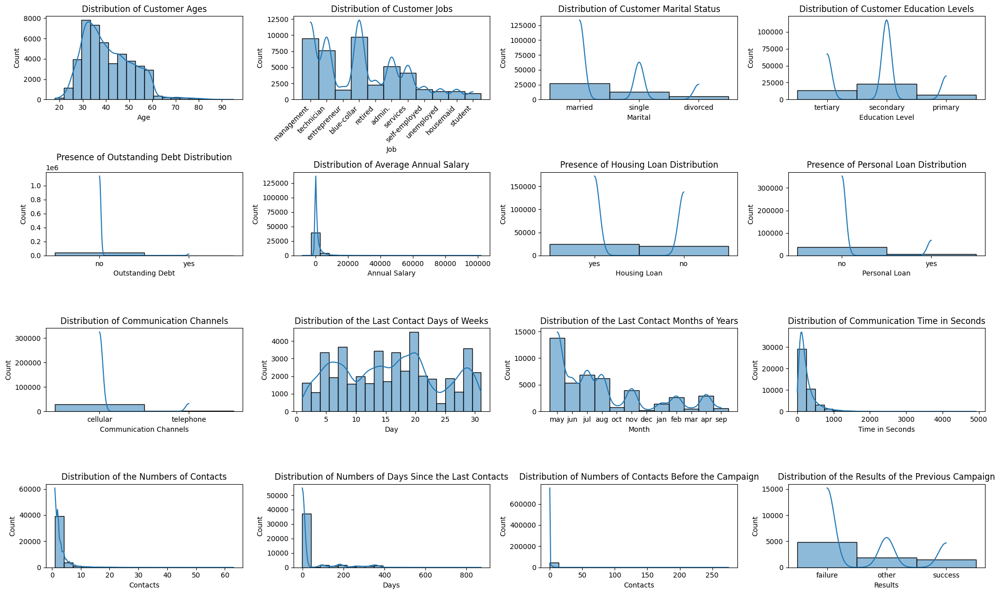

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms(data, plot_params, cols=4):
    # Calculate the number of rows needed
    num_plots = len(plot_params)
    rows = (num_plots // cols) + (num_plots % cols > 0)
    
    # Create subplots
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 3))
    
    # Flatten axes array for easy iteration
    axes = axes.flatten()

    for i, (column, params) in enumerate(plot_params.items()):
        rotation = params[2] if len(params) == 3 else 0
        sns.histplot(data=data, x=column, bins=20, kde=True, ax=axes[i])
        axes[i].set_title(params[0])
        axes[i].set_xlabel(params[1])
        axes[i].set_ylabel('Count')
        if rotation:
            axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=rotation, ha='right')

    # Remove any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Dictionary to store plot parameters for each column
plot_params = {
    'age': ('Distribution of Customer Ages', 'Age'),
    'job': ('Distribution of Customer Jobs', 'Job', 45),
    'marital': ('Distribution of Customer Marital Status', 'Marital'),
    'education': ('Distribution of Customer Education Levels', 'Education Level'),
    'default': ('Presence of Outstanding Debt Distribution', 'Outstanding Debt'),
    'balance': ('Distribution of Average Annual Salary', 'Annual Salary'),
    'housing': ('Presence of Housing Loan Distribution', 'Housing Loan'),
    'loan': ('Presence of Personal Loan Distribution', 'Personal Loan'),
    'contact': ('Distribution of Communication Channels', 'Communication Channels'),
    'day_of_week': ('Distribution of the Last Contact Days of Weeks', 'Day'),
    'month': ('Distribution of the Last Contact Months of Years', 'Month'),
    'duration': ('Distribution of Communication Time in Seconds', 'Time in Seconds'),
    'campaign': ('Distribution of the Numbers of Contacts', 'Contacts'),
    'pdays': ('Distribution of Numbers of Days Since the Last Contacts', 'Days'),
    'previous': ('Distribution of Numbers of Contacts Before the Campaign', 'Contacts'),
    'poutcome': ('Distribution of the Results of the Previous Campaign', 'Results')
}

# Plot histograms in a grid layout
plot_histograms(X, plot_params)

Histogram Distribution of the Target Value

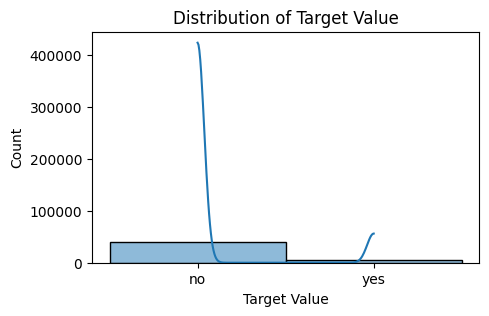

In [10]:
plt.figure(figsize=(5, 3))
sns.histplot(data=y, x='y', bins=20, kde=True)
plt.title('Distribution of Target Value')
plt.xlabel('Target Value')
plt.ylabel('Count')
plt.show()

Pair Plots

PAIR PLOTS OF ATTRIBUTES



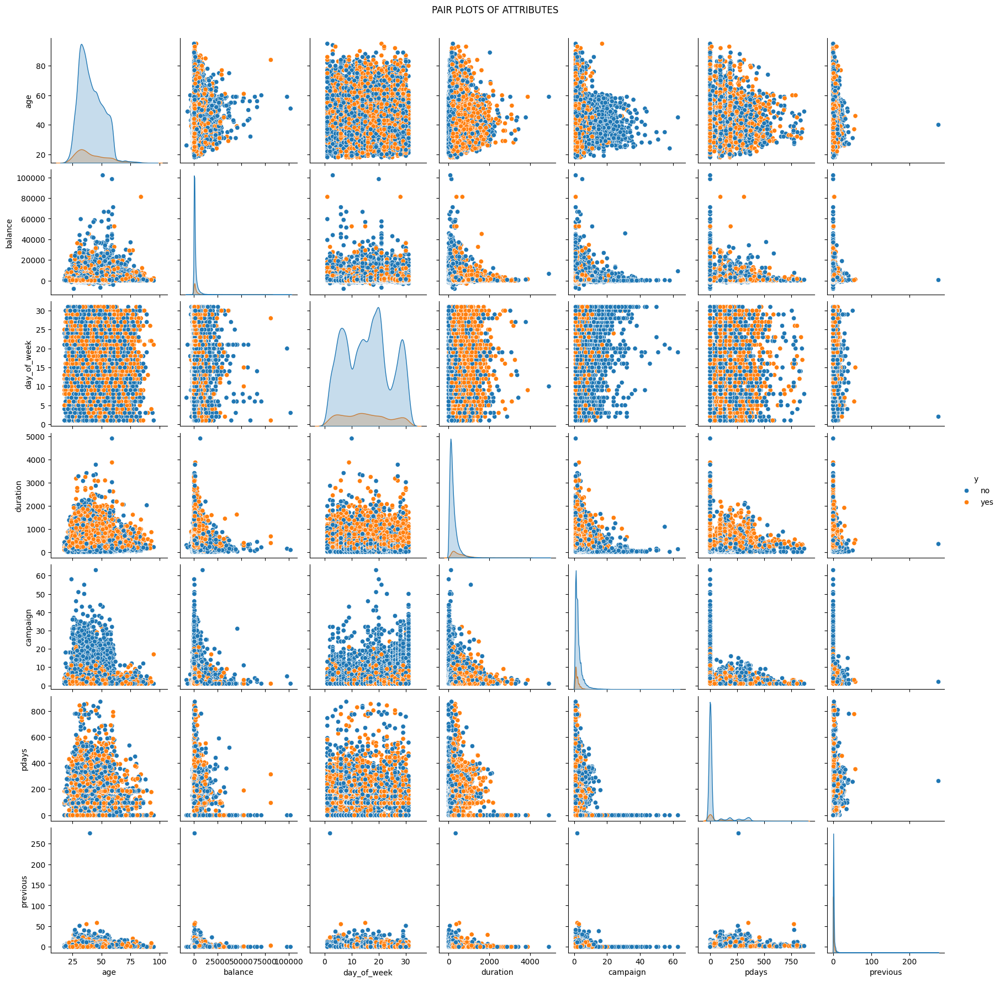

In [11]:
print("PAIR PLOTS OF ATTRIBUTES\n")
sns.pairplot(df, diag_kind='kde', hue='y')
plt.suptitle('PAIR PLOTS OF ATTRIBUTES', y=1.02)
plt.show()

### **BOXPLOT GENERATION**

As it can be understood from the definition of some attributes and their distributions, it is not that logical to draw the boxplot. Even though this is the case, boxplot generation for each attribute has been performed in order not to miss anything.

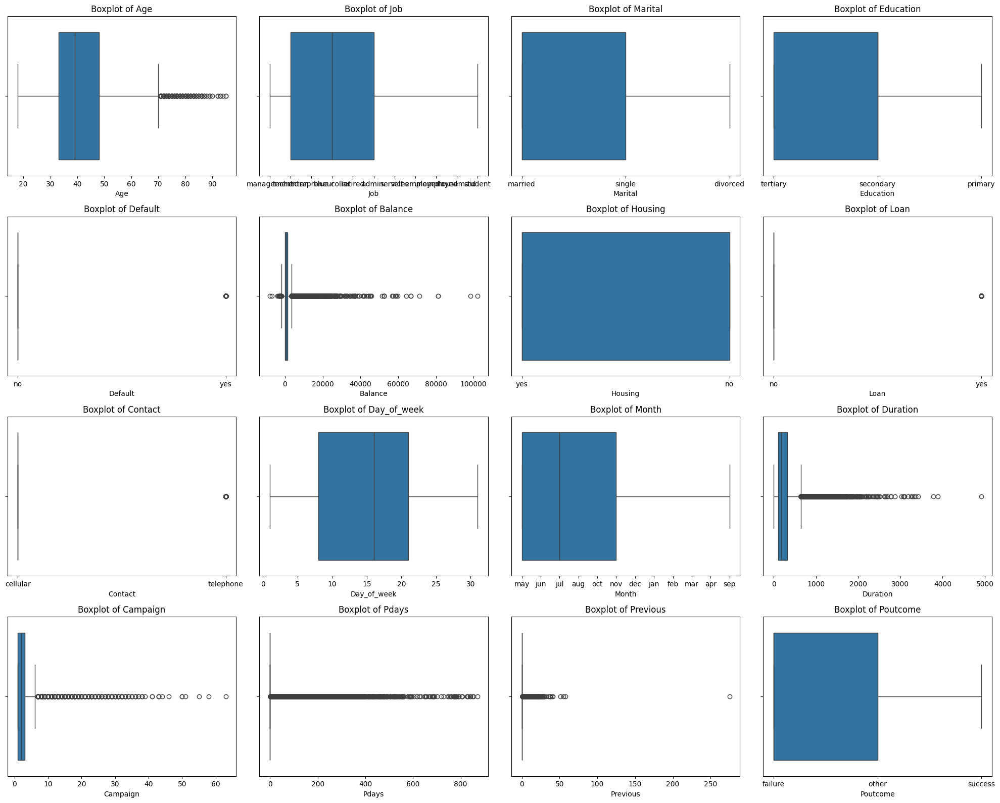

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Get the list of all columns in the X 
columns = X.columns

# Number of columns for the subplot grid
cols = 4  # Adjust this number based on how many columns you want per row
rows = (len(columns) // cols) + (len(columns) % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))

# Flatten axes array for easy iteration
axes = axes.flatten()

for i, column in enumerate(columns):
    sns.boxplot(x=X[column], ax=axes[i])
    axes[i].set_title(f'Boxplot of {column.capitalize()}')
    axes[i].set_xlabel(column.capitalize())

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### **Correlation Heatmap**

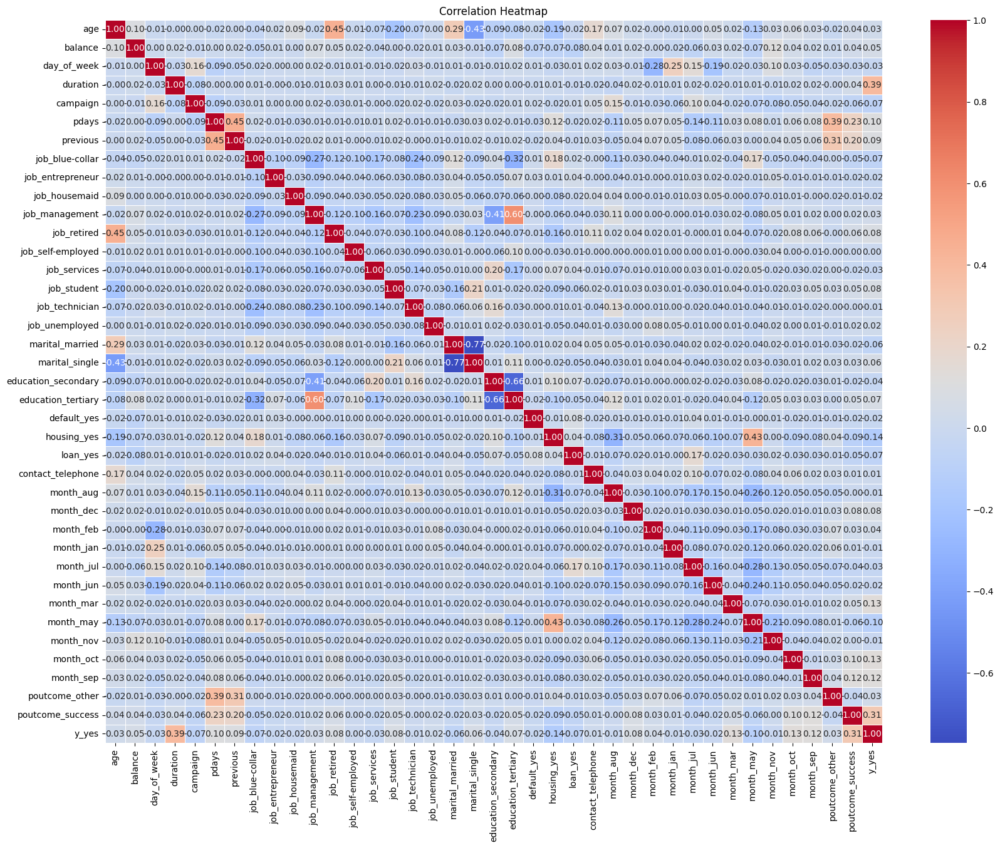

In [13]:
df_encoded = pd.get_dummies(df, drop_first=True)

# Check for and handle missing values
df_encoded = df_encoded.dropna()

# Calculate the correlation matrix
corr_matrix = df_encoded.corr()

# Generate the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

Check & Handle Outliers

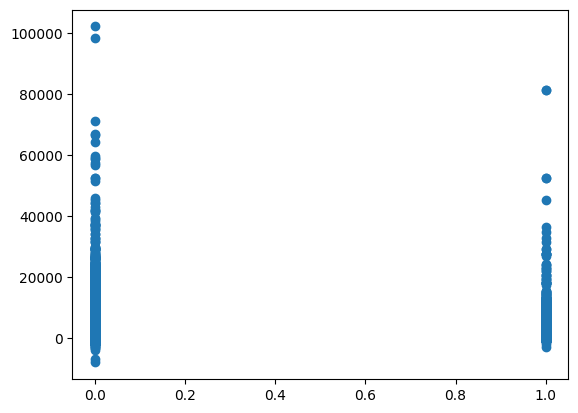

In [14]:
import numpy as np

u, ind = np.unique(y, return_inverse=True)
plt.scatter(ind, df['balance'])

plt.show()

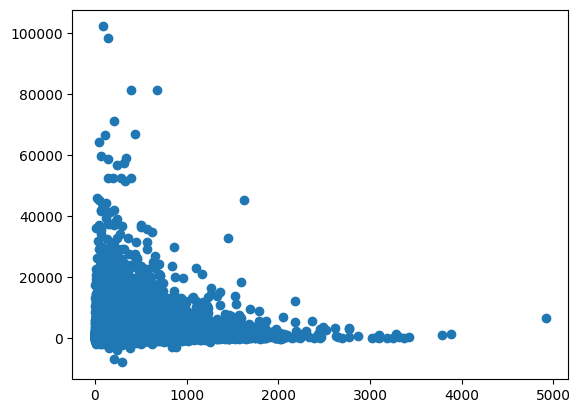

In [15]:
plt.scatter( df['duration'], df['balance'])

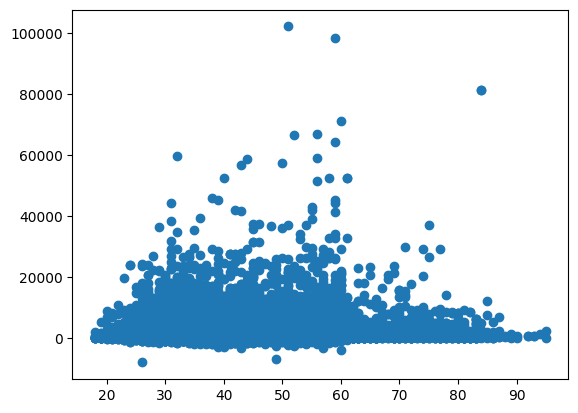

In [16]:
plt.scatter(df['age'], df['balance'])

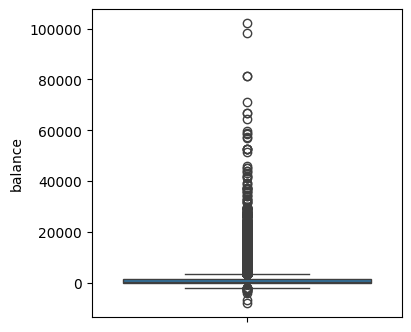

In [17]:
X = X[X['balance'] <= 55000]
plt.figure(figsize=(4, 4))
sns.boxplot(df['balance'])
plt.show()

### **Education - Job**

<Axes: xlabel='education', ylabel='job'>

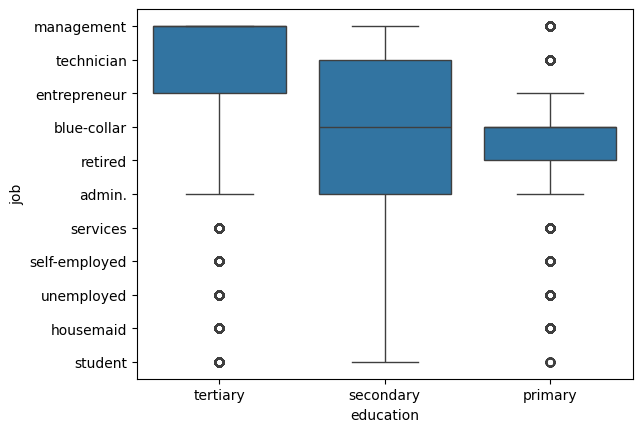

In [18]:
sns.boxplot(data=df, x="education", y="job")

NaN Değer Kontrolü

In [19]:
import pandas as pd

nan_counts = {column: df[column].isna().sum() for column in df.columns}
nan_counts_df = pd.DataFrame([nan_counts], index=['NaN Counts'])

display(nan_counts_df)

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome,y
NaN Counts,0,288,0,1857,0,0,0,0,13020,0,0,0,0,0,0,36959,0


Fill the Null Values in Education

In [20]:
X.loc[(X['education'].isnull()) & (X['job'] == 'admin.'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'blue-collar'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'entrepreneur'), 'education'] = 'tertiary'
X.loc[(X['education'].isnull()) & (X['job'] == 'housemaid'), 'education'] = 'primary'
X.loc[(X['education'].isnull()) & (X['job'] == 'management'), 'education'] = 'tertiary'
X.loc[(X['education'].isnull()) & (X['job'] == 'retired'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'self-employed'), 'education'] = 'tertiary'
X.loc[(X['education'].isnull()) & (X['job'] == 'services'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'student'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'technician'), 'education'] = 'secondary'
X.loc[(X['education'].isnull()) & (X['job'] == 'unemployed'), 'education'] = 'secondary'

Null Value Control After Filling in the 'education' Column According to the 'education'-'job' Relationship

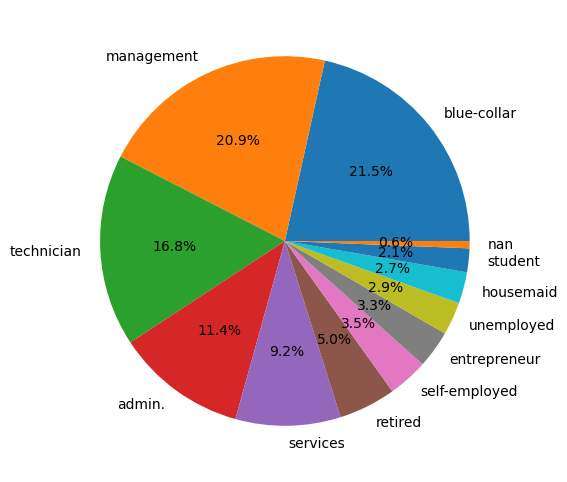

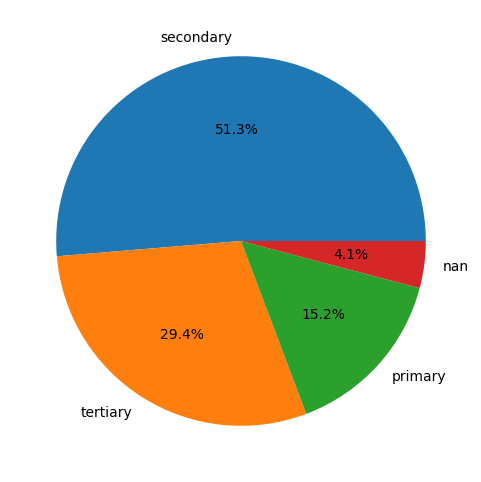

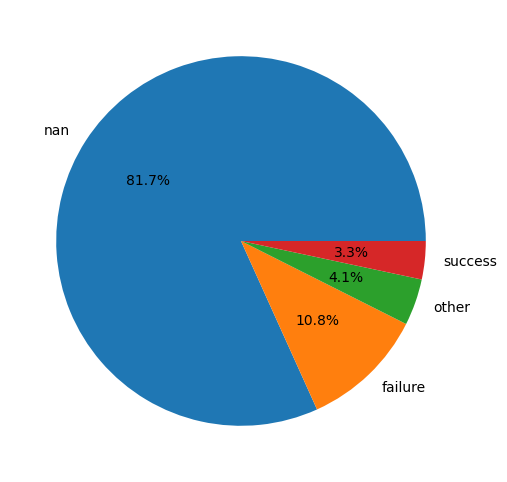

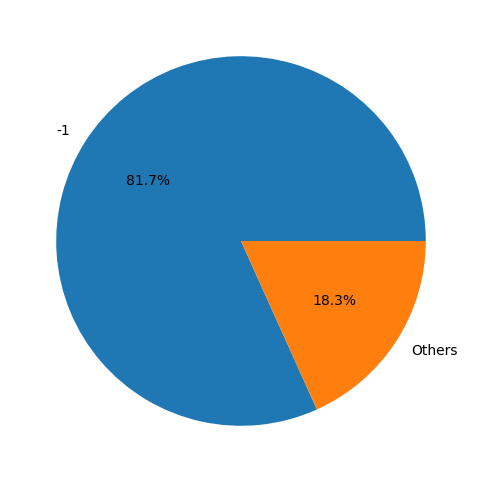

In [21]:
job_counts = df['job'].value_counts(dropna=False)
plt.figure(figsize = (6, 6))
plt.pie(job_counts, labels=job_counts.index, autopct='%1.1f%%')

education_counts = df['education'].value_counts(dropna=False)
plt.figure(figsize = (6, 6))
plt.pie(education_counts, labels=education_counts.index, autopct='%1.1f%%')

poutcome_counts = df['poutcome'].value_counts(dropna=False)
plt.figure(figsize = (6, 6))
plt.pie(poutcome_counts, labels=poutcome_counts.index, autopct='%1.1f%%')
plt.show()

pdays_counts = df['pdays'].value_counts(dropna=False)
plt.figure(figsize=(6, 6))

threshold = 0.02
counts_sum = pdays_counts.sum()
filtered_counts = pdays_counts[pdays_counts/counts_sum > threshold]
other_count = pdays_counts[pdays_counts/counts_sum <= threshold].sum()

# Adding the "Others" category if it exists
if other_count > 0:
    filtered_counts['Others'] = other_count

# Plotting the pie chart with updated labels and figure size
plt.pie(filtered_counts, labels=filtered_counts.index, autopct='%1.1f%%')
plt.show()

In [22]:
nan_counts = {column: X[column].isna().sum() for column in X.columns}
nan_counts_df = pd.DataFrame([nan_counts], index=['NaN Counts'])

display(nan_counts_df)

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome
NaN Counts,0,288,0,127,0,0,0,0,13018,0,0,0,0,0,0,36948


In [23]:
df = df.drop(columns=['contact', 'poutcome'])

In [24]:
nan_counts = {column: df[column].isna().sum() for column in df.columns}
nan_counts_df = pd.DataFrame([nan_counts], index=['NaN Counts'])

display(nan_counts_df)

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,y
NaN Counts,0,288,0,1857,0,0,0,0,0,0,0,0,0,0,0


In [25]:
df = df.dropna()

In [26]:
nan_counts = {column: df[column].isna().sum() for column in df.columns}
nan_counts_df = pd.DataFrame([nan_counts], index=['NaN Counts'])

display(nan_counts_df)

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,y
NaN Counts,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
display(df)

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,no,2143,yes,no,5,may,261,1,-1,0,no
1,44,technician,single,secondary,no,29,yes,no,5,may,151,1,-1,0,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,5,may,76,1,-1,0,no
5,35,management,married,tertiary,no,231,yes,no,5,may,139,1,-1,0,no
6,28,management,single,tertiary,no,447,yes,yes,5,may,217,1,-1,0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,17,nov,977,3,-1,0,yes
45207,71,retired,divorced,primary,no,1729,no,no,17,nov,456,2,-1,0,yes
45208,72,retired,married,secondary,no,5715,no,no,17,nov,1127,5,184,3,yes
45209,57,blue-collar,married,secondary,no,668,no,no,17,nov,508,4,-1,0,no


In [28]:
min_value = df['day_of_week'].min()
max_value = df['day_of_week'].max()

min_max_df = pd.DataFrame({
    'Statistic': ['Minimum değer', 'Maksimum değer'],
    'day_of_week Value': [min_value, max_value]
})

display(min_max_df)

,Statistic,day_of_week Value
0,Minimum değer,1
1,Maksimum değer,31


In [29]:
job_value_counts = df['job'].value_counts()
job_counts_df = pd.DataFrame(list(job_value_counts.items()), columns=['Job', 'Counts'])
display(job_counts_df.T)

,0,1,2,3,4,5,6,7,8,9,10
Job,blue-collar,management,technician,admin.,services,retired,self-employed,entrepreneur,unemployed,housemaid,student
Counts,9278,9216,7355,5000,4004,2145,1540,1411,1274,1195,775


In [30]:
categorical_columns = df.select_dtypes(include=['object']).columns
print("Kategorik verili sütunlar:")
categorical = pd.DataFrame(categorical_columns, columns=['Categorical Columns'])
display(categorical.T)

Kategorik verili sütunlar:


,0,1,2,3,4,5,6,7
Categorical Columns,job,marital,education,default,housing,loan,month,y


In [31]:
mon_value = df['month'].unique()
mon_value_df = pd.DataFrame(list(mon_value), columns=['Month'])
display(mon_value_df.T)


,0,1,2,3,4,5,6,7,8,9,10,11
Month,may,jun,jul,aug,oct,nov,dec,jan,feb,mar,apr,sep


### **ENCODING**

In [32]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

encoder = LabelEncoder()
for column in ['job', 'marital', 'education', 'default', 'housing', 'loan']:
    df[column] = encoder.fit_transform(df[column])

display(X.head())

,age,job,marital,education,default,balance,housing,loan,contact,day_of_week,month,duration,campaign,pdays,previous,poutcome
0,58,management,married,tertiary,no,2143,yes,no,NaN,5,may,261,1,-1,0,NaN
1,44,technician,single,secondary,no,29,yes,no,NaN,5,may,151,1,-1,0,NaN
2,33,entrepreneur,married,secondary,no,2,yes,yes,NaN,5,may,76,1,-1,0,NaN
3,47,blue-collar,married,secondary,no,1506,yes,no,NaN,5,may,92,1,-1,0,NaN
4,33,NaN,single,NaN,no,1,no,no,NaN,5,may,198,1,-1,0,NaN


In [33]:
month_mapping = {
    'jan': 1, 'feb': 2, 'mar': 3, 'apr': 4, 'may': 5, 'jun': 6,
    'jul': 7, 'aug': 8, 'sep': 9, 'oct': 10, 'nov': 11, 'dec': 12
}
df['month'] = df['month'].map(month_mapping)

In [34]:
df = df.sample(frac=1).reset_index(drop=True)
display(df.head())

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,y
0,51,4,1,2,0,0,0,0,22,8,111,2,-1,0,no
1,28,0,1,1,0,252,1,0,9,5,448,1,-1,0,no
2,56,1,1,1,0,-256,1,1,14,5,92,1,370,2,no
3,40,1,1,1,0,1313,0,0,14,5,87,1,-1,0,no
4,55,9,1,1,0,511,1,0,1,6,108,1,94,2,no


In [35]:
df['y'] = df['y'].map({'no': 0, 'yes': 1})
display(df.head())

,age,job,marital,education,default,balance,housing,loan,day_of_week,month,duration,campaign,pdays,previous,y
0,51,4,1,2,0,0,0,0,22,8,111,2,-1,0,0
1,28,0,1,1,0,252,1,0,9,5,448,1,-1,0,0
2,56,1,1,1,0,-256,1,1,14,5,92,1,370,2,0
3,40,1,1,1,0,1313,0,0,14,5,87,1,-1,0,0
4,55,9,1,1,0,511,1,0,1,6,108,1,94,2,0


### **NORMALIZATION - ROBUST SCALING**

In [36]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
df = scaler.fit_transform(df)

### **PCA VISUALITAIONS**

In [37]:
from sklearn.model_selection import train_test_split

X_features = df[:, :-1]
y_target = df[:, -1]
X_train, X_test, y_train, y_test = train_test_split(X_features, y_target, test_size=0.2, random_state=2)

X_df = pd.DataFrame(X_features)

In [38]:
from sklearn.cluster import KMeans

km = KMeans(n_clusters=2,
            init='k-means++', 
            n_init=10,
            max_iter=100, 
            random_state=42)

clusters_predict = km.fit_predict(X_df)

In [39]:
# Calculation the principal components in 2D and 3D

import prince
import plotly.express as px

def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()

    fig = px.scatter_3d(df, 
                        x=columns[0], 
                        y=columns[1], 
                        z=columns[2],
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()

pca_3d_object, df_pca_3d = get_pca_3d(X_df, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              1.653        11.81%                     11.81%
1              1.510        10.78%                     22.59%
2              1.355         9.68%                     32.28%


In [40]:
def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()


    fig = px.scatter(df, 
                        x=columns[0], 
                        y=columns[1],
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()
    
pca_2d_object, df_pca_2d = get_pca_2d(X_df, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.5)

### **MODELLING**

In [41]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

In [42]:
# Random Forest
rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)  # No need to scale features for Random Forest

lr = LogisticRegression(max_iter=500 , random_state = 2)
lr.fit(X_train,y_train)

LogisticRegression(max_iter=500, random_state=2)

In [43]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score

rf_predictions = rf.predict(X_test)
rf_accuracy = accuracy_score(y_test, rf_predictions)
rf_recall = recall_score(y_test, rf_predictions, average='macro')
rf_precision = precision_score(y_test, rf_predictions, average='macro')
rf_f1 = f1_score(y_test, rf_predictions, average='macro')

lr_predictions = lr.predict(X_test)
lr_accuracy = accuracy_score(y_test, lr_predictions)
lr_recall = recall_score(y_test, lr_predictions, average='macro')
lr_precision = precision_score(y_test, lr_predictions, average='macro')
lr_f1 = f1_score(y_test, lr_predictions, average='macro')


Confusion Matrices & Classification Report

In [44]:
from sklearn.metrics import classification_report, confusion_matrix

rf_conf_matrix = confusion_matrix(y_test, rf_predictions)
rf_class_report = classification_report(y_test, rf_predictions, output_dict=True)
rf_report_df = pd.DataFrame(rf_class_report).transpose()

print("Decision Tree Confusion Matrix:")
display(pd.DataFrame(rf_conf_matrix, columns=np.unique(y_test), index=np.unique(y_test)))
print("Decision Tree Classification Report:")
display(rf_report_df)

lr_conf_matrix = confusion_matrix(y_test, lr_predictions)
lr_class_report = classification_report(y_test, lr_predictions, output_dict=True)
lr_report_df = pd.DataFrame(lr_class_report).transpose()

print("Logistic Regression Confusion Matrix:")
display(pd.DataFrame(lr_conf_matrix, columns=np.unique(y_test), index=np.unique(y_test)))
print("Logistic Regression Classification Report:")
display(lr_report_df)


Decision Tree Confusion Matrix:


,0.0,1.0
0.0,7404,237
1.0,623,375


Decision Tree Classification Report:


,precision,recall,f1-score,support
0.0,0.922387,0.968983,0.945111,7641.000000
1.0,0.612745,0.375752,0.465839,998.000000
accuracy,0.900451,0.900451,0.900451,0.900451
macro avg,0.767566,0.672367,0.705475,8639.000000
weighted avg,0.886616,0.900451,0.889744,8639.000000


Logistic Regression Confusion Matrix:


,0.0,1.0
0.0,7493,148
1.0,778,220


Logistic Regression Classification Report:


,precision,recall,f1-score,support
0.0,0.905936,0.980631,0.941805,7641.000000
1.0,0.597826,0.220441,0.322108,998.000000
accuracy,0.892812,0.892812,0.892812,0.892812
macro avg,0.751881,0.600536,0.631957,8639.000000
weighted avg,0.870343,0.892812,0.870216,8639.000000


In [45]:
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Recall', 'Precision', 'F1 Score'],
    'Random Forest': [rf_accuracy, rf_recall, rf_precision, rf_f1],
    'Logistic Regression': [lr_accuracy, lr_recall, lr_precision, lr_f1]
})

# Display the table
display(results)

,Metric,Random Forest,Logistic Regression
0,Accuracy,0.900451,0.892812
1,Recall,0.672367,0.600536
2,Precision,0.767566,0.751881
3,F1 Score,0.705475,0.631957


ROC - AUC Curves

ROC_AUC_SCORE for Random Forest is 0.6723673101995117


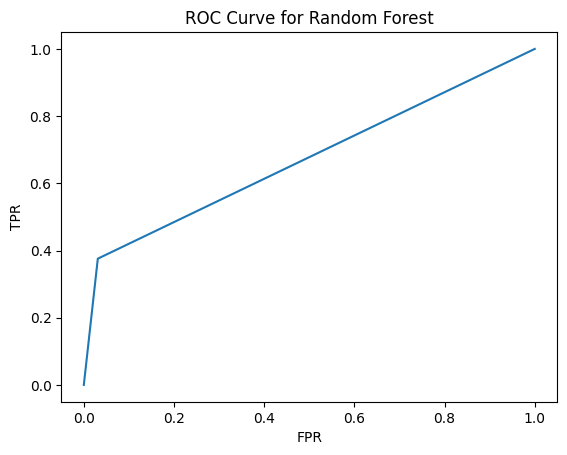

ROC_AUC_SCORE for Logistic Regressiın is 0.6005358446247291


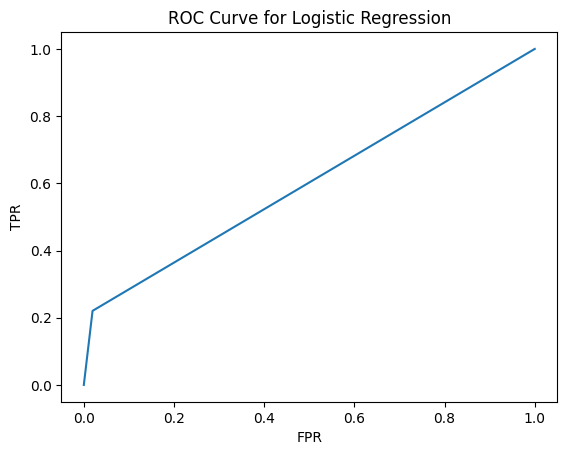

In [46]:
from sklearn.metrics import roc_curve, roc_auc_score

rf_auc = roc_auc_score(y_test, rf_predictions)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, rf_predictions)
print('ROC_AUC_SCORE for Random Forest is', rf_auc)
plt.plot(false_positive_rate, true_positive_rate)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve for Random Forest')
plt.show()

lr_auc = roc_auc_score(y_test, lr_predictions)
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, lr_predictions)
print('ROC_AUC_SCORE for Logistic Regressiın is', lr_auc)
plt.plot(false_positive_rate, true_positive_rate)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve for Logistic Regression')
plt.show()


Grid Search & Cross-Validation for Hyperparameter Tuning

In [47]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 300, num=3)]  
max_features = ['sqrt'] # # of features to consider at every split
max_depth = [int(x) for x in np.linspace(5, 10, num=2)] # max # of levels in tree
max_depth.append(None)
min_samples_split = [2, 5] # min # of samples required to split a node
min_samples_leaf = [1, 2] # min # of samples required at each leaf node
criterion = ['gini', 'entropy']

rf_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'criterion': criterion}

print("Grid Parameters for Random Forest")
display((rf_grid))

penalty = ["l2"]    # norm of the penalty
C = [0.001, 0.01, 0.1, 1, 10]   # inverse of regularization strength

lr_grid = {"penalty": penalty,
            "C": C}

print("Grid Parameters for Logistic Regression")
display((lr_grid))

Grid Parameters for Random Forest


{'n_estimators': [100, 200, 300],
 'max_features': ['sqrt'],
 'max_depth': [5, 10, None],
 'min_samples_split': [2, 5],
 'min_samples_leaf': [1, 2],
 'criterion': ['gini', 'entropy']}

Grid Parameters for Logistic Regression


{'penalty': ['l2'], 'C': [0.001, 0.01, 0.1, 1, 10]}

In [48]:
from sklearn.model_selection import GridSearchCV

rf_grid_search = GridSearchCV(RandomForestClassifier(), rf_grid, cv=5, scoring='accuracy', n_jobs=-1)
rf_grid_search.fit(X_train, y_train)
best_rf = rf_grid_search.best_estimator_
print("Best Random Forest Parameters:", rf_grid_search.best_params_)

lr_grid_search = GridSearchCV(LogisticRegression(max_iter=500), lr_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_grid_search.fit(X_train, y_train)
best_lr = lr_grid_search.best_estimator_
print("Best SVC Parameters:", lr_grid_search.best_params_)

Best Random Forest Parameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Best SVC Parameters: {'C': 10, 'penalty': 'l2'}


In [49]:
rf_params = rf_grid_search.best_params_
best_rf = RandomForestClassifier(**rf_params)
best_rf.fit(X_train, y_train)

lr_params = lr_grid_search.best_params_
best_lr = LogisticRegression(**lr_params, max_iter=500)
best_lr.fit(X_train, y_train)

LogisticRegression(C=10, max_iter=500)

In [50]:
rf_predictions_grid = best_rf.predict(X_test)
rf_conf_matrix_grid = confusion_matrix(y_test, rf_predictions_grid)
rf_class_report_grid = classification_report(y_test, rf_predictions_grid, output_dict=True)
rf_report_df_grid = pd.DataFrame(rf_class_report_grid).transpose()

rf_accuracy_grid = accuracy_score(y_test, rf_predictions_grid)
rf_recall_grid = recall_score(y_test, rf_predictions_grid, average='macro')
rf_precision_grid = precision_score(y_test, rf_predictions_grid, average='macro')
rf_f1_grid = f1_score(y_test, rf_predictions_grid, average='macro')

print("Random Forest Accuracy Using Grid Search Parameters:", rf_accuracy_grid) 
print("Random Forest Confusion Matrix Using Grid Search Parameters:")
display(pd.DataFrame(rf_conf_matrix_grid, columns=np.unique(y_test), index=np.unique(y_test)))
print("Random Forest Classification Report Using Grid Search Parameters:")
display(rf_report_df_grid) 

lr_predictions_grid = best_lr.predict(X_test)

lr_conf_matrix_grid = confusion_matrix(y_test, lr_predictions_grid)
lr_class_report_grid = classification_report(y_test, lr_predictions_grid, output_dict=True)
lr_report_df_grid = pd.DataFrame(lr_class_report_grid).transpose()

lr_accuracy_grid = accuracy_score(y_test, lr_predictions_grid)
lr_recall_grid = recall_score(y_test, lr_predictions_grid, average='macro')
lr_precision_grid = precision_score(y_test, lr_predictions_grid, average='macro')
lr_f1_grid = f1_score(y_test, lr_predictions_grid, average='macro')

print("Logistic Regression Accuracy Using Grid Search Parameters:", lr_accuracy_grid) 
print("Logistic Regression Confusion Matrix Using Grid Search Parameters:")
display(pd.DataFrame(lr_conf_matrix_grid, columns=np.unique(y_test), index=np.unique(y_test)))
print("Logistic Regression Classification Report Using Grid Search Parameters:")
display(lr_report_df_grid)

Random Forest Accuracy Using Grid Search Parameters: 0.9013774742447043
Random Forest Confusion Matrix Using Grid Search Parameters:


,0.0,1.0
0.0,7406,235
1.0,617,381


Random Forest Classification Report Using Grid Search Parameters:


,precision,recall,f1-score,support
0.0,0.923096,0.969245,0.945608,7641.000000
1.0,0.618506,0.381764,0.472119,998.000000
accuracy,0.901377,0.901377,0.901377,0.901377
macro avg,0.770801,0.675504,0.708863,8639.000000
weighted avg,0.887909,0.901377,0.890909,8639.000000


Logistic Regression Accuracy Using Grid Search Parameters: 0.892927422155342
Logistic Regression Confusion Matrix Using Grid Search Parameters:


,0.0,1.0
0.0,7494,147
1.0,778,220


Logistic Regression Classification Report Using Grid Search Parameters:


,precision,recall,f1-score,support
0.0,0.905948,0.980762,0.941871,7641.000000
1.0,0.599455,0.220441,0.322344,998.000000
accuracy,0.892927,0.892927,0.892927,0.892927
macro avg,0.752701,0.600601,0.632108,8639.000000
weighted avg,0.870541,0.892927,0.870302,8639.000000


In [51]:
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Recall', 'Precision', 'F1 Score'],
    'Random Forest': [rf_accuracy, rf_recall, rf_precision, rf_f1],
    'Logistic Regression': [lr_accuracy, lr_recall, lr_precision, lr_f1],
    'Random Forest Using Grid Search Parameters':[rf_accuracy_grid, rf_recall_grid, rf_precision_grid, rf_f1_grid],
    'Logistic Regression Grid Search Parameters': [lr_accuracy_grid, lr_recall_grid, lr_precision_grid, lr_f1_grid]
})

# Display the table
display(results)

,Metric,Random Forest,Logistic Regression,Random Forest Using Grid Search Parameters,Logistic Regression Grid Search Parameters
0,Accuracy,0.900451,0.892812,0.901377,0.892927
1,Recall,0.672367,0.600536,0.675504,0.600601
2,Precision,0.767566,0.751881,0.770801,0.752701
3,F1 Score,0.705475,0.631957,0.708863,0.632108


Improve Model Performance Using Ensemble Methods

In [52]:
from sklearn.ensemble import AdaBoostClassifier, StackingClassifier

# Boosting with AdaBooST using the Best Random Forest
boosting = AdaBoostClassifier(best_rf, n_estimators=50, random_state=2, algorithm="SAMME")
boosting.fit(X_train, y_train)
boosting_predictions = boosting.predict(X_test)
print("Boosting with AdaBoost Accuracy:", accuracy_score(y_test, boosting_predictions))

# Stacking with Decision Tree, and SVM
# using decision tree classifier as the final estimator
models = [('rf', best_lr), ('lr', best_lr)]
stacking1 = StackingClassifier(estimators=models, final_estimator=RandomForestClassifier())
stacking1.fit(X_train, y_train)
stacking1_predictions = stacking1.predict(X_test)
print("Stacking Accuracy with Decision Tree as the Final Estimator:", accuracy_score(y_test, stacking1_predictions))

# using naive bayes as the final estimator
stacking2 = StackingClassifier(estimators=models, final_estimator=LogisticRegression())
stacking2.fit(X_train, y_train)
stacking2_predictions = stacking2.predict(X_test)
print("Stacking Accuracy withh Naive Bayes as the Final Estimator:", accuracy_score(y_test, stacking2_predictions))

KeyboardInterrupt: 

In [ ]:
boosting_accuracy = accuracy_score(y_test, boosting_predictions)
boosting_recall = recall_score(y_test, boosting_predictions, average='macro')
boosting_precision = precision_score(y_test, boosting_predictions, average='macro')
boosting_f1 = f1_score(y_test, boosting_predictions, average='macro')
boosting_conf_matrix = confusion_matrix(y_test, rf_predictions_grid)
boosting_class_report = classification_report(y_test, rf_predictions_grid, output_dict=True)
boosting_report_df = pd.DataFrame(rf_class_report_grid).transpose()

print("AdaBoost Using Random Forest Estimator Accuracy:", boosting_accuracy) 
print("AdaBoost Using Random Forest Estimator Confusion Matrix:")
display(pd.DataFrame(boosting_conf_matrix, columns=np.unique(y_test), index=np.unique(y_test)))
print("AdaBoost Using Random Forest Estimator Classification Report:")
display(boosting_report_df) 

stacking1_accuracy = accuracy_score(y_test, stacking1_predictions)
stacking1_recall = recall_score(y_test, stacking1_predictions, average='macro')
stacking1_precision = precision_score(y_test, stacking1_predictions, average='macro')
stacking1_f1 = f1_score(y_test, stacking1_predictions, average='macro')
stacking1_conf_matrix = confusion_matrix(y_test, stacking1_predictions)
stacking1_class_report = classification_report(y_test, stacking1_predictions, output_dict=True)
stacking1_report_df = pd.DataFrame(stacking1_class_report).transpose()

print("Stacking Using Random Forest as the Final Estimator Accuracy:", stacking1_accuracy)
print("Stacking Using Random Forest as the Final Estimator Confusion Matrix:")
display(pd.DataFrame(stacking1_conf_matrix, columns=np.unique(y_test), index=np.unique(y_test)))
print("Stacking Using Random Forest as the Final Estimator Classification Report:")
display(stacking1_report_df)

stacking2_accuracy = accuracy_score(y_test, stacking2_predictions)
stacking2_recall = recall_score(y_test, stacking2_predictions, average='macro')
stacking2_precision = precision_score(y_test, stacking2_predictions, average='macro')
stacking2_f1 = f1_score(y_test, stacking2_predictions, average='macro')
stacking2_conf_matrix = confusion_matrix(y_test, stacking2_predictions)
stacking2_class_report = classification_report(y_test, stacking2_predictions, output_dict=True)
stacking2_report_df = pd.DataFrame(stacking2_class_report).transpose()

print("Stacking Using Logistic Regression as the Final Estimator Accuracy:", stacking2_accuracy)
print("Stacking Using Logistic Regression as the Final Estimator Confusion Matrix:")
display(pd.DataFrame(stacking2_conf_matrix, columns=np.unique(y_test), index=np.unique(y_test)))
print("Stacking Using Logistic Regression as the Final Estimator Classification Report:")
display(stacking2_report_df)

In [ ]:
results = pd.DataFrame({
    'Metric': ['Accuracy', 'Recall', 'Precision', 'F1 Score'],
    'Random Forest': [rf_accuracy, rf_recall, rf_precision, rf_f1],
    'Logistic Regression': [lr_accuracy, lr_recall, lr_precision, lr_f1],
    'Random Forest Using Grid Search Parameters':[rf_accuracy_grid, rf_recall_grid, rf_precision_grid, rf_f1_grid],
    'Logistic Regression Grid Search Parameters': [lr_accuracy_grid, lr_recall_grid, lr_precision_grid, lr_f1_grid],
    'AdaBoost Using Random Forest Estimator':[boosting_accuracy, boosting_recall, boosting_precision, boosting_f1],
    'Stacking Using Random Forest as the Final Estimator':[stacking1_accuracy, stacking1_recall, stacking1_precision, stacking1_f1],
    'Stacking Using Logistic Regression as the Final Estimator':[stacking2_accuracy, stacking2_recall, stacking2_precision, stacking2_f1]
})

# Display the table
display(results)

In [ ]:
y_test

ROC Curves

In [ ]:
#ROC Curves
# Since this is a binary classification, ...


fpr1 , tpr1, thresholds1 = roc_curve(y_test, rf.predict_proba(X_test)[:, 1])
fpr2 , tpr2, thresholds2 = roc_curve(y_test, lr.predict_proba(X_test)[:, 1])
fpr3 , tpr3, thresholds3 = roc_curve(y_test, best_rf.predict_proba(X_test)[:, 1])
fpr4 , tpr4, thresholds4 = roc_curve(y_test, best_lr.predict_proba(X_test)[:, 1])
fpr5 , tpr5, thresholds5 = roc_curve(y_test, boosting.predict_proba(X_test)[:, 1])
fpr6 , tpr6, thresholds6 = roc_curve(y_test, stacking1.predict_proba(X_test)[:, 1])
fpr7 , tpr7, thresholds7 = roc_curve(y_test, stacking2.predict_proba(X_test)[:, 1])


plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr1, tpr1, label= "Random Forest")
plt.plot(fpr2, tpr2, label= "Logistic Regression")
plt.plot(fpr3, tpr3, label= "Random Forest After Grid Search")
plt.plot(fpr4, tpr4, label= "Logistic Regression After Grid Search")
plt.plot(fpr5, tpr5, label= "Boosting")
plt.plot(fpr6, tpr6, label= "Stacking1")
plt.plot(fpr7, tpr7, label= "Stacking2")
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title('Receiver Operating Characteristic')
plt.show()

Accuracy Comparison

In [ ]:
accuracies = [
    rf_accuracy,
    lr_accuracy,
    rf_accuracy_grid,
    lr_accuracy_grid,
    boosting_accuracy,
    stacking1_accuracy,
    stacking2_accuracy
]

# for labeling
model_names = [
    'Random Forest',
    'Logistic Regression',
    'Random Forest After Grid Search',
    'Logistic Regression After Grid Search',
    'Boosting',
    'Stacking1',
    'Stacking2'
]

# Create an accuracy histogram
plt.figure(figsize=(10, 6))
plt.bar(model_names, accuracies, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Histogram of Models')
plt.xticks(rotation=45)
plt.ylim([min(accuracies) - 0.05, max(accuracies) + 0.05]) 
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

accuracies_df = {"Model Name":model_names, 
                 "Accuracy Value":accuracies}
display(pd.DataFrame(accuracies_df))